# Starbucks Capstone Challenge

### Introduction

This data set contains simulated data that mimics customer behavior on the Starbucks rewards mobile app. Once every few days, Starbucks sends out an offer to users of the mobile app. An offer can be merely an advertisement for a drink or an actual offer such as a discount or BOGO (buy one get one free). Some users might not receive any offer during certain weeks. 

Not all users receive the same offer, and that is the challenge to solve with this data set.

Your task is to combine transaction, demographic and offer data to determine which demographic groups respond best to which offer type. This data set is a simplified version of the real Starbucks app because the underlying simulator only has one product whereas Starbucks actually sells dozens of products.

Every offer has a validity period before the offer expires. As an example, a BOGO offer might be valid for only 5 days. You'll see in the data set that informational offers have a validity period even though these ads are merely providing information about a product; for example, if an informational offer has 7 days of validity, you can assume the customer is feeling the influence of the offer for 7 days after receiving the advertisement.

You'll be given transactional data showing user purchases made on the app including the timestamp of purchase and the amount of money spent on a purchase. This transactional data also has a record for each offer that a user receives as well as a record for when a user actually views the offer. There are also records for when a user completes an offer. 

Keep in mind as well that someone using the app might make a purchase through the app without having received an offer or seen an offer.

### Example

To give an example, a user could receive a discount offer buy 10 dollars get 2 off on Monday. The offer is valid for 10 days from receipt. If the customer accumulates at least 10 dollars in purchases during the validity period, the customer completes the offer.

However, there are a few things to watch out for in this data set. Customers do not opt into the offers that they receive; in other words, a user can receive an offer, never actually view the offer, and still complete the offer. For example, a user might receive the "buy 10 dollars get 2 dollars off offer", but the user never opens the offer during the 10 day validity period. The customer spends 15 dollars during those ten days. There will be an offer completion record in the data set; however, the customer was not influenced by the offer because the customer never viewed the offer.

### Cleaning

This makes data cleaning especially important and tricky.

You'll also want to take into account that some demographic groups will make purchases even if they don't receive an offer. From a business perspective, if a customer is going to make a 10 dollar purchase without an offer anyway, you wouldn't want to send a buy 10 dollars get 2 dollars off offer. You'll want to try to assess what a certain demographic group will buy when not receiving any offers.

### Final Advice

Because this is a capstone project, you are free to analyze the data any way you see fit. For example, you could build a machine learning model that predicts how much someone will spend based on demographics and offer type. Or you could build a model that predicts whether or not someone will respond to an offer. Or, you don't need to build a machine learning model at all. You could develop a set of heuristics that determine what offer you should send to each customer (i.e., 75 percent of women customers who were 35 years old responded to offer A vs 40 percent from the same demographic to offer B, so send offer A).

# Data Sets

The data is contained in three files:

* portfolio.json - containing offer ids and meta data about each offer (duration, type, etc.)
* profile.json - demographic data for each customer
* transcript.json - records for transactions, offers received, offers viewed, and offers completed

Here is the schema and explanation of each variable in the files:

**portfolio.json**
* id (string) - offer id
* offer_type (string) - type of offer ie BOGO, discount, informational
* difficulty (int) - minimum required spend to complete an offer
* reward (int) - reward given for completing an offer
* duration (int) - time for offer to be open, in days
* channels (list of strings)

**profile.json**
* age (int) - age of the customer 
* became_member_on (int) - date when customer created an app account
* gender (str) - gender of the customer (note some entries contain 'O' for other rather than M or F)
* id (str) - customer id
* income (float) - customer's income

**transcript.json**
* event (str) - record description (ie transaction, offer received, offer viewed, etc.)
* person (str) - customer id
* time (int) - time in hours since start of test. The data begins at time t=0
* value - (dict of strings) - either an offer id or transaction amount depending on the record



### Project completion
The goal for this project is to predict if the offer will be completed or not.

The work is divided in 3 steps:
- Data extraction 
- Data transformation
- Modeling and predicting

We will start by importing necessary libraries.

In [1747]:
import pandas as pd
import math
import json
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from common_funcs import get_logistic_regression_predictions, get_rfc_predictions
from sklearn.model_selection import train_test_split

# Extracting data
As a first step, we import the projects data from json files. Then, we show the first 5 rows of the set and check their size.

In [1748]:
# read in the json files
portfolio = pd.read_json('data/portfolio.json', orient='records', lines=True)
profile = pd.read_json('data/profile.json', orient='records', lines=True)
transcript = pd.read_json('data/transcript.json', orient='records', lines=True)

portfolio.head()

,reward,channels,difficulty,duration,offer_type,id
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7


In [1749]:
transcript.head()

,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


In [1750]:
profile.head()

,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,None,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [1751]:
print("Numer of columns of the frame profile is:", profile.shape[1])
print("Numer of rows of the frame profile is:", profile.shape[0])
print("Numer of columns of the frame transcript is:", transcript.shape[1])
print("Numer of rows of the frame transcript is:", transcript.shape[0])
print("Numer of columns of the frame portfolio is:", portfolio.shape[1])
print("Numer of rows of the frame portfolio is:", portfolio.shape[0])

Numer of columns of the frame profile is: 5
Numer of rows of the frame profile is: 17000
Numer of columns of the frame transcript is: 4
Numer of rows of the frame transcript is: 306534
Numer of columns of the frame portfolio is: 6
Numer of rows of the frame portfolio is: 10


# Transform data
As the second step, we will transform data such that we can use it later for creating the model for generating predictions.
We will do that by enabling the following:
- Transfrom data such that we merge frames
- Replace categorical categories to the numerical ones if applicable (e.g., introducing new columns, etc.)
- Check missing data for each column
- Replace the missing data if applicable




We start by renaming columns so we can merge these frames eventually.

In [1752]:
portfolio.rename(columns = {"id": "offer_id"}, inplace = True)
transcript.rename(columns = {"person": "person_id"}, inplace = True)
profile.rename(columns = {"id": "person_id"}, inplace = True)

Since column value in transcript is a list, we try to break it down by introducing new columns.

In [1753]:
# count how many elements in the list of the column value
transcript["offer_id_count"] = transcript["value"].apply(lambda x: len(x))

In [1754]:
# take the first element in the list
transcript["first_col"] = transcript["value"].apply(lambda x:  list(x.keys())[0])
transcript.groupby("first_col").describe()

time                                                           \
              count        mean         std  min    25%    50%    75%    max   
first_col                                                                      
amount     138953.0  381.584334  201.697230  0.0  210.0  402.0  552.0  714.0   
offer id   134002.0  341.932120  198.004152  0.0  168.0  408.0  504.0  714.0   
offer_id    33579.0  401.052801  192.352614  0.0  240.0  432.0  564.0  714.0   

          offer_id_count                                     
                   count mean  std  min  25%  50%  75%  max  
first_col                                                    
amount          138953.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  
offer id        134002.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  
offer_id         33579.0  2.0  0.0  2.0  2.0  2.0  2.0  2.0

We notice that the first element of the list are values in the set {amount, offer_id, offer id}.

In [1755]:
# take the second element in the list
transcript["second_col"] = transcript["value"].apply(lambda x:  list(x.keys())[1] if len(list(x.keys()))>1 else None)
transcript.groupby("second_col").describe()

time                                                           \
              count        mean         std  min    25%    50%    75%    max   
second_col                                                                     
reward      33579.0  401.052801  192.352614  0.0  240.0  432.0  564.0  714.0   

           offer_id_count                                     
                    count mean  std  min  25%  50%  75%  max  
second_col                                                    
reward            33579.0  2.0  0.0  2.0  2.0  2.0  2.0  2.0

We notice that the second element of the list are values in reward (if not NaN).

In [1756]:
# take the third element in the list
sum(~transcript["value"].apply(lambda x:  list(x.keys())[2] if len(list(x.keys()))>2 else None).isna())


0

We notice that the list in the column value has max 2 elements. Now we try to extract values to these new elements.

In [1757]:
transcript["offer_id"] = transcript["value"].apply(lambda x:  x[list(x.keys())[0]] if list(x.keys())[0]=="offer_id" or list(x.keys())[0]=="offer id" else None)
transcript["amount"] = transcript["value"].apply(lambda x:  x[list(x.keys())[0]] if list(x.keys())[0]=="amount" else None)
transcript["reward_val"] = transcript["value"].apply(lambda x:  x[list(x.keys())[1]] if len(x.keys())>1 else None)
transcript.drop(columns = ["first_col", "second_col",  "offer_id_count", "value"], inplace = True)
transcript.head()

,person_id,event,time,offer_id,amount,reward_val
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN,NaN
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,NaN
2,e2127556f4f64592b11af22de27a7932,offer received,0,2906b810c7d4411798c6938adc9daaa5,NaN,NaN
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,fafdcd668e3743c1bb461111dcafc2a4,NaN,NaN
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,4d5c57ea9a6940dd891ad53e9dbe8da0,NaN,NaN


In [1758]:
# check if reward appearing in the transcript frame is the same as the one appearing in portfolio
transcript_rew = transcript[~(transcript["reward_val"].isna())]
tr_new = pd.merge(transcript_rew, portfolio, on="offer_id")
sum(tr_new["reward_val"] == tr_new["reward"])/tr_new.shape[0]

1.0

Since the reward column appearing in the transcript frame is the same as the one appearing in portfolio, we can drop that column.

In [1759]:
transcript.drop(columns = ["reward_val"], inplace = True) 
transcript.head()

,person_id,event,time,offer_id,amount
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN
2,e2127556f4f64592b11af22de27a7932,offer received,0,2906b810c7d4411798c6938adc9daaa5,NaN
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,fafdcd668e3743c1bb461111dcafc2a4,NaN
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,4d5c57ea9a6940dd891ad53e9dbe8da0,NaN


Now we merge datafrmaes transcript and portfolio.

In [1760]:
df_new = pd.merge(transcript, portfolio, on="offer_id")
df_new.head()

,person_id,event,time,offer_id,amount,reward,channels,difficulty,duration,offer_type
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN,5,"[web, email, mobile]",5,7,bogo
1,ebe7ef46ea6f4963a7dd49f501b26779,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN,5,"[web, email, mobile]",5,7,bogo
2,f082d80f0aac47a99173ba8ef8fc1909,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN,5,"[web, email, mobile]",5,7,bogo
3,c0d210398dee4a0895b24444a5fcd1d2,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN,5,"[web, email, mobile]",5,7,bogo
4,57dd18ec5ddc46828afb81ec5977bef2,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN,5,"[web, email, mobile]",5,7,bogo


Since we are only interested if the offer is completed or not, we will not consider offer_viewed in our analysis.

In [1761]:
df_new = df_new[~(df_new["event"]=='offer viewed')]

Lets now try to replace the column event with the offer_completed that can be 0 or 1.

In [1762]:
# we firstly sort by time so it takes us less time to calculate if the offer is completed or no
df_new.sort_values(by = "time", inplace = True)

In [1763]:
df_new.head()
df_new.reset_index(inplace = True)
df_new.drop(columns = ["index"], inplace = True)

In [1764]:
df_new.head()

,person_id,event,time,offer_id,amount,reward,channels,difficulty,duration,offer_type
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN,5,"[web, email, mobile]",5,7,bogo
1,8cc0db430879405898d8390ca74ad13a,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,5,"[web, email]",20,10,discount
2,84545eb7824b4aaa822bae2e5e6cecaa,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,5,"[web, email]",20,10,discount
3,036e4bedca2045afad50fda2d3b505ab,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,5,"[web, email]",20,10,discount
4,5c29ee406ced442ca7fe5523b4160412,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,5,"[web, email]",20,10,discount


In [1765]:
# we iterate throw rows of df_new and define values of offer_completed column

df_tmp = pd.DataFrame({})

# indices when offer is received
active_indices = []
# when the offer expires
active_time = []
# person_id
person_ids = []
# offer_id
offer_ids = []
df_new["offer_completed"] = 0
for ind, row in df_new.iterrows():
    tmp = 1
    if len(df_tmp.index.tolist())>0:
        # the offer is not available anymore (it has expired)
        while row["time"]>df_tmp.iloc[0].time:
            df_tmp.drop([df_tmp.index.tolist()[0]], inplace = True)
            if len(df_tmp.index.tolist())==0:
                tmp = 0
                break
        if tmp and row["event"]=="offer completed":
            lst = df_tmp[(df_tmp['offer_id'] == row.offer_id) & (df_tmp['person_id'] == row.person_id )].index.tolist()
            if len(lst)>0:
                df_new["offer_completed"].iloc[df_tmp.loc[lst[0]].ind] = 1
                df_tmp.drop([lst[0]], inplace = True)
    if row["event"]=="offer received":
        df_tmp = df_tmp._append({'ind':ind, 'time':row["time"]+24*row["duration"], 'offer_id':row.offer_id, 'person_id':row.person_id}, ignore_index = True)

/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/833168933.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new["offer_completed"].iloc[df_tmp.loc[lst[0]].ind] = 1
/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/833168933.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new["offer_completed"].iloc[df_tmp.loc[lst[0]].ind] = 1
/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/833168933.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Then, we drop the column offer completed.

In [1766]:
df_new = df_new[~(df_new["event"]=='offer completed')]

In [1767]:
df_new.head()

,person_id,event,time,offer_id,amount,reward,channels,difficulty,duration,offer_type,offer_completed
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,NaN,5,"[web, email, mobile]",5,7,bogo,1
1,8cc0db430879405898d8390ca74ad13a,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,5,"[web, email]",20,10,discount,1
2,84545eb7824b4aaa822bae2e5e6cecaa,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,5,"[web, email]",20,10,discount,0
3,036e4bedca2045afad50fda2d3b505ab,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,5,"[web, email]",20,10,discount,0
4,5c29ee406ced442ca7fe5523b4160412,offer received,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,NaN,5,"[web, email]",20,10,discount,1


Since the amount is always NaN if there is offer id, we can drop it. Additionally, there is no more value with the column event, so we can drop that too. Also, we have index column that does not bring any value.

In [1768]:
df_new.drop(columns = ["event",  "amount"], inplace = True)

/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/1864245569.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new.drop(columns = ["event",  "amount"], inplace = True)


There are three offer types: informational, bogo and discount. We will check what is the completion rate for each of these offers.

In [1769]:
df_new.groupby(["offer_type"]).mean()

,time,reward,difficulty,duration,offer_completed
offer_type,,,,,
bogo,332.805141,7.500246,7.500246,6.005607,0.496344
discount,332.553580,3.003503,11.759552,8.499362,0.571588
informational,332.179849,0.000000,0.000000,3.499967,0.000000


In [1770]:
df_new.head()

,person_id,time,offer_id,reward,channels,difficulty,duration,offer_type,offer_completed
0,78afa995795e4d85b5d9ceeca43f5fef,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,5,"[web, email, mobile]",5,7,bogo,1
1,8cc0db430879405898d8390ca74ad13a,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,"[web, email]",20,10,discount,1
2,84545eb7824b4aaa822bae2e5e6cecaa,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,"[web, email]",20,10,discount,0
3,036e4bedca2045afad50fda2d3b505ab,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,"[web, email]",20,10,discount,0
4,5c29ee406ced442ca7fe5523b4160412,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,"[web, email]",20,10,discount,1


Now, lets try to convert multiple categorical data to numerical ones.

In [1771]:
# We convert the type of the offer from the categorical data into numerical by introducing new columns
for type in ["bogo", "discount", "informational"]:
    df_new[type] = df_new["offer_type"].apply(lambda x: 1 if x==type else 0)

# we can drop the column offer_type now
df_new.drop(columns = ["offer_type"], inplace = True)


/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/356376462.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new[type] = df_new["offer_type"].apply(lambda x: 1 if x==type else 0)
/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/356376462.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new[type] = df_new["offer_type"].apply(lambda x: 1 if x==type else 0)
/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/356376462.py:3: SettingWithCopyWarning: 
A valu

In [1772]:
# identify which are the possible channels
channel = ["email", "web", "mobile", "social"]
tmp = df_new["channels"].apply(lambda x: 0 if(all(y in channel for y in x)) else 1)
sum(tmp)

0

In [1773]:
# resolve channels
for channel in ["email", "web", "mobile", "social"]:
    df_new[channel] = df_new["channels"].apply(lambda x: 1 if channel in x else 0)
df_new.drop(columns = ["channels"], inplace = True)
df_new.head()

/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/835853255.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new[channel] = df_new["channels"].apply(lambda x: 1 if channel in x else 0)
/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/835853255.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new[channel] = df_new["channels"].apply(lambda x: 1 if channel in x else 0)
/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/835853255.py:3: SettingWithCopyWarn

,person_id,time,offer_id,reward,difficulty,duration,offer_completed,bogo,discount,informational,email,web,mobile,social
0,78afa995795e4d85b5d9ceeca43f5fef,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,5,5,7,1,1,0,0,1,1,1,0
1,8cc0db430879405898d8390ca74ad13a,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,20,10,1,0,1,0,1,1,0,0
2,84545eb7824b4aaa822bae2e5e6cecaa,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,20,10,0,0,1,0,1,1,0,0
3,036e4bedca2045afad50fda2d3b505ab,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,20,10,0,0,1,0,1,1,0,0
4,5c29ee406ced442ca7fe5523b4160412,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,20,10,1,0,1,0,1,1,0,0


In [1774]:
# transform became member to only year
profile["became_member_year"]=profile.became_member_on.apply(lambda x: x//10000)
profile.drop(columns = "became_member_on", inplace = True)
profile.head()

,gender,age,person_id,income,became_member_year
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,NaN,2017
1,F,55,0610b486422d4921ae7d2bf64640c50b,112000.0,2017
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,NaN,2018
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,100000.0,2017
4,None,118,a03223e636434f42ac4c3df47e8bac43,NaN,2017


In [1775]:
# mapping of binary string values to int
d = {"M": 0, None: 0.5, "F": 1}
profile["gender"] = profile["gender"].map(d)
profile.head()

,gender,age,person_id,income,became_member_year
0,0.5,118,68be06ca386d4c31939f3a4f0e3dd783,NaN,2017
1,1.0,55,0610b486422d4921ae7d2bf64640c50b,112000.0,2017
2,0.5,118,38fe809add3b4fcf9315a9694bb96ff5,NaN,2018
3,1.0,75,78afa995795e4d85b5d9ceeca43f5fef,100000.0,2017
4,0.5,118,a03223e636434f42ac4c3df47e8bac43,NaN,2017


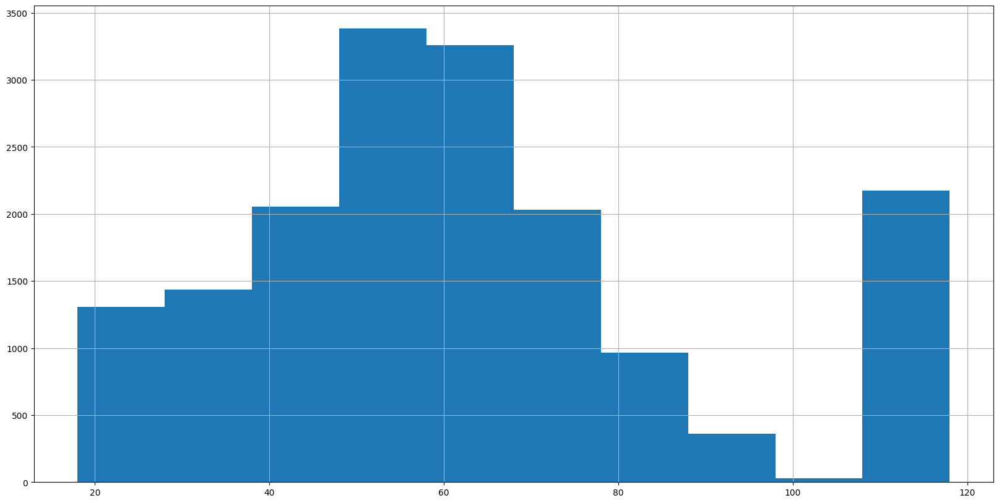

In [1776]:
plt.figure(figsize=(20,10)) 
profile['age'].hist();

<AxesSubplot:>

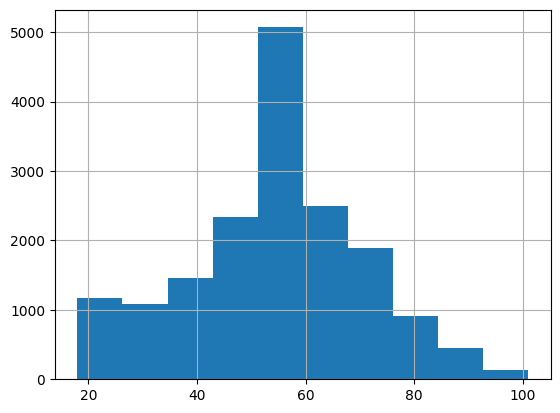

In [1777]:
m_age = profile[~(profile["age"]==118)]["age"].mean()
profile["age"] = profile["age"].apply(lambda x: m_age if x == 118 else x)
profile['age'].hist()

In [1778]:
df = pd.merge(df_new, profile, on="person_id")
df.head()

,person_id,time,offer_id,reward,difficulty,duration,offer_completed,bogo,discount,informational,email,web,mobile,social,gender,age,income,became_member_year
0,78afa995795e4d85b5d9ceeca43f5fef,0,9b98b8c7a33c4b65b9aebfe6a799e6d9,5,5,7,1,1,0,0,1,1,1,0,1.0,75.0,100000.0,2017
1,78afa995795e4d85b5d9ceeca43f5fef,168,5a8bc65990b245e5a138643cd4eb9837,0,0,3,0,0,0,1,1,0,1,1,1.0,75.0,100000.0,2017
2,78afa995795e4d85b5d9ceeca43f5fef,408,ae264e3637204a6fb9bb56bc8210ddfd,10,10,7,1,1,0,0,1,0,1,1,1.0,75.0,100000.0,2017
3,78afa995795e4d85b5d9ceeca43f5fef,504,f19421c1d4aa40978ebb69ca19b0e20d,5,5,5,1,1,0,0,1,1,1,1,1.0,75.0,100000.0,2017
4,8cc0db430879405898d8390ca74ad13a,0,0b1e1539f2cc45b7b9fa7c272da2e1d7,5,20,10,1,0,1,0,1,1,0,0,1.0,72.0,75000.0,2015


In [1779]:
# check for missing values in common frame df
df.isna().sum()

person_id                0
time                     0
offer_id                 0
reward                   0
difficulty               0
duration                 0
offer_completed          0
bogo                     0
discount                 0
informational            0
email                    0
web                      0
mobile                   0
social                   0
gender                 916
age                      0
income                9776
became_member_year       0
dtype: int64

In [1780]:
# replace missing values in gender by 0.5
df["gender"] = df["gender"].apply(lambda x: 0.5 if pd.isna(x) else x)


In [1781]:
# replace missing values in income by mean
df['income'].fillna((df['income'].mean()), inplace=True)

In [1782]:
# if we check email channel we will realize it is always 1.
df["email"].describe()

count    76277.0
mean         1.0
std          0.0
min          1.0
25%          1.0
50%          1.0
75%          1.0
max          1.0
Name: email, dtype: float64

In [1783]:
# since it is always 1, it does not bring any value
df.drop(columns = ["email"], inplace = True)

Lets see correlational heatmap now.

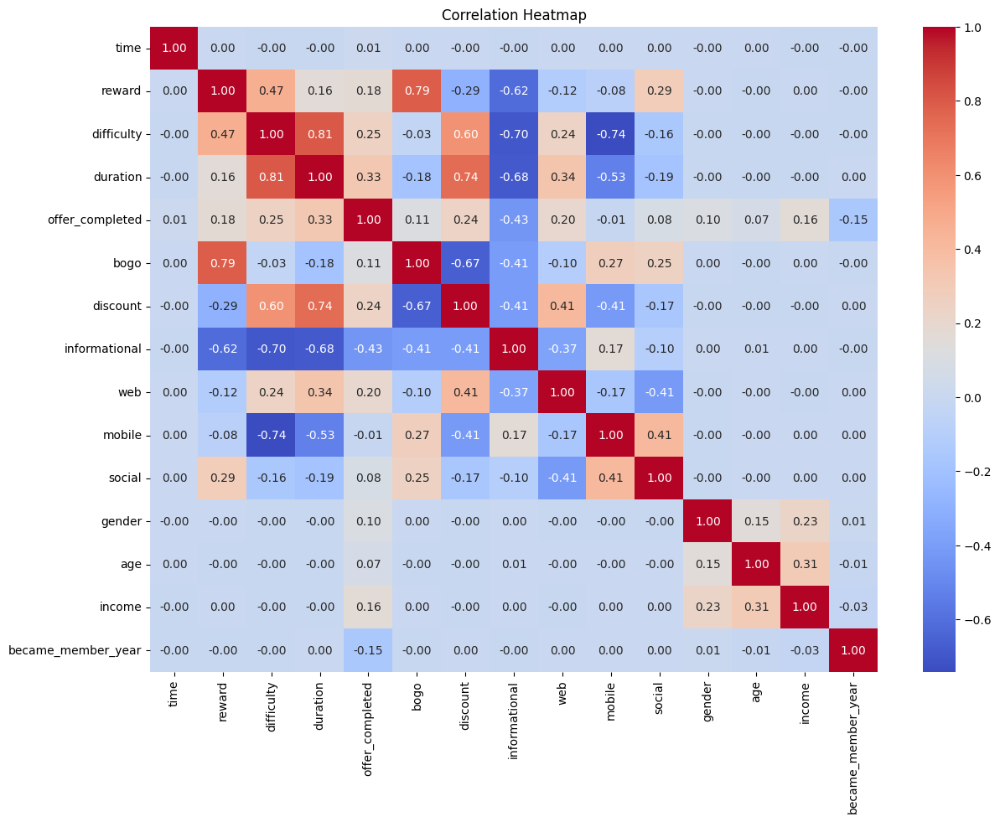

In [1784]:
numeric_df = df.select_dtypes(include=[np.number])
plt.figure(figsize=(14, 10))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

We notice that there is a strong correlation of Offer_completed with the used channel, reward, difficulty, duration, the type of the offer, income and the year one became the member.

Some <b>conclusions</b> are:
- Higher the reward (and difficulty) people more likely to complete the offer
- Using web channel seems to increase the likelihod to complete the offer 
- If the duration of the offer is longer, people are more likely to complete the offer
- Larger the income, more likely to complete the offer
- If the member has been added long time ago, it is less likely to complete offer.

# Modeling and prediction
As a third step, we select columns we use for creating the model based on Logistic Regression and Random Forest. The model will be used to predict if the offer will be completed or not.

In [1785]:
remove_cols = ["offer_completed", "offer_id", "person_id", "time"]
keep_cols_simple = df.columns.drop(remove_cols)
X = df[keep_cols_simple]
y = df["offer_completed"]
X.head()

,reward,difficulty,duration,bogo,discount,informational,web,mobile,social,gender,age,income,became_member_year
0,5,5,7,1,0,0,1,1,0,1.0,75.0,100000.0,2017
1,0,0,3,0,0,1,0,1,1,1.0,75.0,100000.0,2017
2,10,10,7,1,0,0,0,1,1,1.0,75.0,100000.0,2017
3,5,5,5,1,0,0,1,1,1,1.0,75.0,100000.0,2017
4,5,20,10,0,1,0,1,0,0,1.0,72.0,75000.0,2015


In [1786]:
# get results of logistic regression
lrc, y_test, y_test_preds = get_logistic_regression_predictions(X, y)

train results
              precision    recall  f1-score   support

           0       0.76      0.73      0.75     30622
           1       0.66      0.69      0.67     22771

    accuracy                           0.72     53393
   macro avg       0.71      0.71      0.71     53393
weighted avg       0.72      0.72      0.72     53393

test results
              precision    recall  f1-score   support

           0       0.76      0.74      0.75     13059
           1       0.66      0.70      0.68      9825

    accuracy                           0.72     22884
   macro avg       0.71      0.72      0.71     22884
weighted avg       0.72      0.72      0.72     22884



Accuracy for the test results is 72%. We can try to improve it with Random Forest, but first lets check the confusion matrix.

Text(0.5, 427.9555555555555, 'Predicted label')

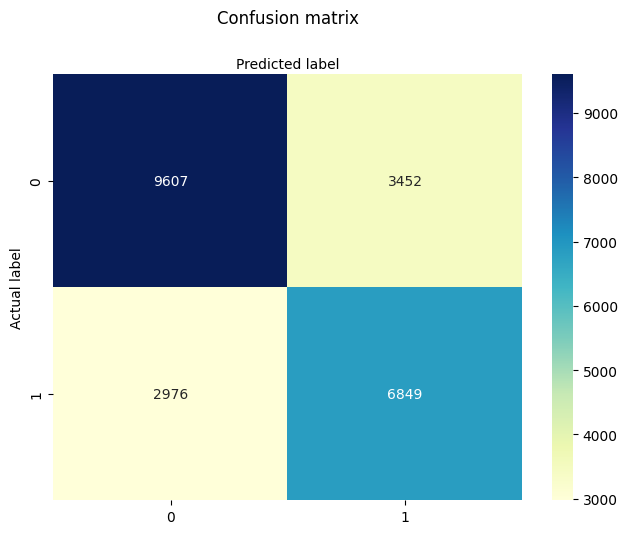

In [1787]:
cnf_matrix = confusion_matrix(y_test, y_test_preds)
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

We see that the model is more likely to produce false negatives than false positives.

In [1788]:
# get results of Random Forest
rfc_cv = get_rfc_predictions(X, y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, n_e

/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
80 fits failed out of a total of 240.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
59 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site-packages/sklearn/base.py", line 1145, in wrapper
    estimator._validate_params()
  File "/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site

train results
              precision    recall  f1-score   support

           0       0.84      0.78      0.81     35003
           1       0.73      0.80      0.76     26018

    accuracy                           0.79     61021
   macro avg       0.78      0.79      0.79     61021
weighted avg       0.79      0.79      0.79     61021

test results
              precision    recall  f1-score   support

           0       0.82      0.77      0.79      8678
           1       0.72      0.78      0.75      6578

    accuracy                           0.77     15256
   macro avg       0.77      0.77      0.77     15256
weighted avg       0.78      0.77      0.77     15256



The accuracy is a higher here - 77%. Lets check if we can improve the model in a different way.

One approach is to seperate the transcript frame into two halves (with respect to time column). The first half od the set can be used to determine what is the likelihood of the user to complete orders and how many transactions they usually make. We could use the second half to get train and test data to check if the offer will be completed or not. So, we want to know some history of the person before predicting.

In [1789]:
# sort by time
df.sort_values(by = ["time"], inplace = True)

In [1790]:
# determine how many days to use to build the history of the user
day_lim = 14
df_first_half = df[df["time"]<=day_lim*24]
df_second_half = df[df["time"]>day_lim*24]

In [1791]:
# calculate average completion using the first half of the dataset
profile["avg_completion"] = profile.person_id.apply(lambda x: df_first_half[df_first_half["person_id"]==x]["offer_completed"].mean())
profile["avg_reward"] = profile.person_id.apply(lambda x: df_first_half[(df_first_half["person_id"]==x) & (df_first_half["offer_completed"]==1)]["reward"].mean(skipna=True))
profile["avg_difficulty"] = profile.person_id.apply(lambda x: df_first_half[(df_first_half["person_id"]==x) & (df_first_half["offer_completed"]==1)]["difficulty"].mean(skipna=True))

In [1792]:
profile.head()

/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site-packages/IPython/core/displayhook.py:281: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


,gender,age,person_id,income,became_member_year,avg_completion,avg_reward,avg_difficulty
0,0.5,54.393524,68be06ca386d4c31939f3a4f0e3dd783,NaN,2017,0.0,NaN,NaN
1,1.0,55.000000,0610b486422d4921ae7d2bf64640c50b,112000.0,2017,NaN,NaN,NaN
2,0.5,54.393524,38fe809add3b4fcf9315a9694bb96ff5,NaN,2018,0.0,NaN,NaN
3,1.0,75.000000,78afa995795e4d85b5d9ceeca43f5fef,100000.0,2017,0.5,5.0,5.0
4,0.5,54.393524,a03223e636434f42ac4c3df47e8bac43,NaN,2017,0.0,NaN,NaN


In [1793]:
# calculate average transaction using the first half of the dataset
tr_amount = transcript[~(transcript["amount"].isna())]
tr_amount.sort_values(by = "time",inplace = True)
tr_amount = tr_amount[tr_amount["time"]>=day_lim*24]
tr_amount = tr_amount[["person_id", "amount"]]
tr_temp = tr_amount.groupby("person_id").describe()
tr_temp.head()

/var/folders/b4/86_yv3rj6ls75prs79x6ryz40000gn/T/ipykernel_91937/104208185.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tr_amount.sort_values(by = "time",inplace = True)


amount                                       \
                                  count       mean       std    min      25%   
person_id                                                                      
0009655768c64bdeb2e877511632db8f    7.0  15.062857  6.561747   8.57  11.3150   
00116118485d4dfda04fdbaba9a87b5c    2.0   1.695000  2.114249   0.20   0.9475   
0011e0d4e6b944f998e987f904e8c1e5    3.0  18.013333  7.855713   8.96  15.5050   
0020c2b971eb4e9188eac86d93036a77    4.0  24.632500  7.685065  17.24  18.9275   
0020ccbbb6d84e358d3414a3ff76cffd    7.0  13.027143  4.983606   7.47   9.6250   

                                                          
                                     50%      75%    max  
person_id                                                 
0009655768c64bdeb2e877511632db8f  13.560  16.2600  28.16  
00116118485d4dfda04fdbaba9a87b5c   1.695   2.4425   3.19  
0011e0d4e6b944f998e987f904e8c1e5  22.050  22.5400  23.03  
0020c2b971eb4e9188eac86d93036a77  23.715  29.4200  33.86  
0020ccbbb6d84e358d3414a3ff76cffd  10.760  16.8150  20.08

In [1794]:
# embedd results of the transactions to the profile
profile["avg_transaction_amount"] = profile.person_id.apply(lambda x: tr_temp[tr_temp.index==x].amount["mean"][0] if len(tr_temp[tr_temp.index==x].amount["mean"])>0 else 0)
profile["avg_transaction_num"] = profile.person_id.apply(lambda x: tr_temp[tr_temp.index==x].amount["count"][0] if len(tr_temp[tr_temp.index==x].amount["count"])>0 else 0)

In [1795]:
# if there is no information about the user, fill it with 0
profile_tmp = profile[["person_id", "avg_completion", "avg_reward", "avg_difficulty", "avg_transaction_amount", "avg_transaction_num"]]
profile_tmp = profile_tmp.fillna(0)
profile_tmp.head()

,person_id,avg_completion,avg_reward,avg_difficulty,avg_transaction_amount,avg_transaction_num
0,68be06ca386d4c31939f3a4f0e3dd783,0.0,0.0,0.0,2.266667,9.0
1,0610b486422d4921ae7d2bf64640c50b,0.0,0.0,0.0,23.220000,1.0
2,38fe809add3b4fcf9315a9694bb96ff5,0.0,0.0,0.0,2.592000,5.0
3,78afa995795e4d85b5d9ceeca43f5fef,0.5,5.0,5.0,24.070000,3.0
4,a03223e636434f42ac4c3df47e8bac43,0.0,0.0,0.0,0.060000,1.0


In [1796]:
# merge the new information to the dataset
df_opt = pd.merge(df_second_half, profile_tmp, on ='person_id')
df_opt.head()

,person_id,time,offer_id,reward,difficulty,duration,offer_completed,bogo,discount,informational,...,social,gender,age,income,became_member_year,avg_completion,avg_reward,avg_difficulty,avg_transaction_amount,avg_transaction_num
0,0679b66105224a0c960efdb95f19ee1d,408,fafdcd668e3743c1bb461111dcafc2a4,2,10,10,1,0,1,0,...,1,0.0,39.0,32000.0,2016,0.333333,2.000000,10.0,1.884545,11.0
1,0679b66105224a0c960efdb95f19ee1d,576,9b98b8c7a33c4b65b9aebfe6a799e6d9,5,5,7,0,1,0,0,...,0,0.0,39.0,32000.0,2016,0.333333,2.000000,10.0,1.884545,11.0
2,c4420b743fd94715a262e01e151d875a,408,f19421c1d4aa40978ebb69ca19b0e20d,5,5,5,1,1,0,0,...,1,1.0,63.0,59000.0,2018,1.000000,4.666667,10.0,16.777273,11.0
3,c4420b743fd94715a262e01e151d875a,504,fafdcd668e3743c1bb461111dcafc2a4,2,10,10,1,0,1,0,...,1,1.0,63.0,59000.0,2018,1.000000,4.666667,10.0,16.777273,11.0
4,c4420b743fd94715a262e01e151d875a,576,5a8bc65990b245e5a138643cd4eb9837,0,0,3,0,0,0,1,...,1,1.0,63.0,59000.0,2018,1.000000,4.666667,10.0,16.777273,11.0


Lets see the correlation map.

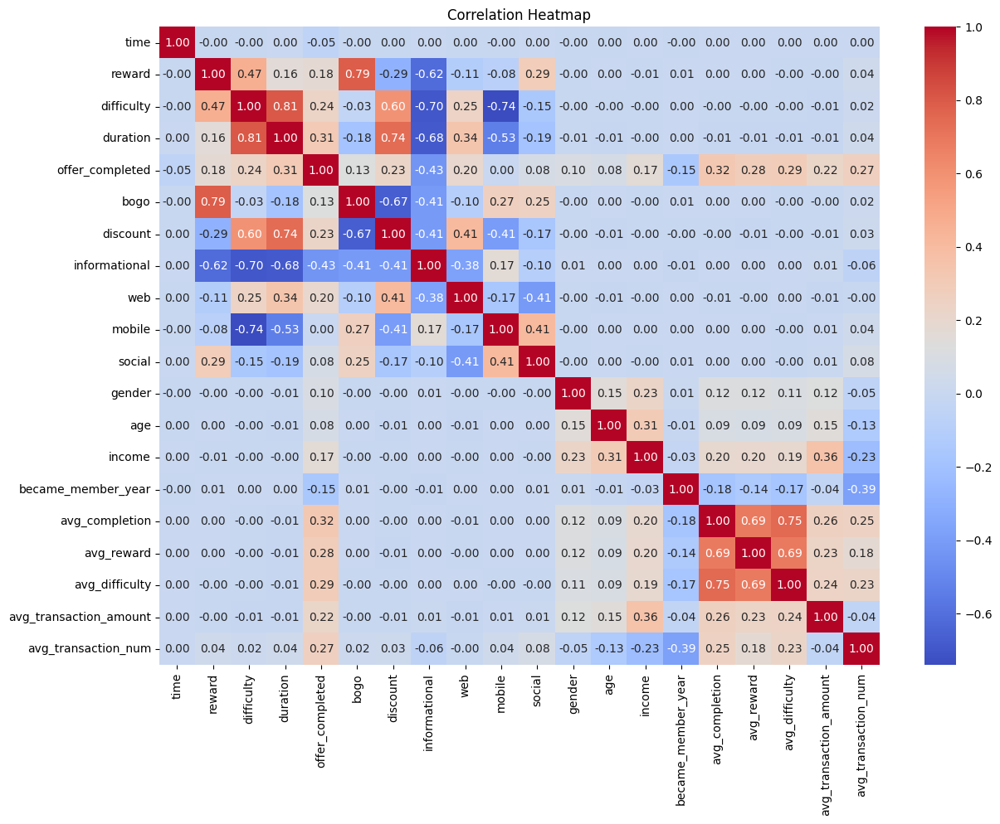

In [1797]:
numeric_df = df_opt.select_dtypes(include=[np.number])
plt.figure(figsize=(14, 10))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

We notice that there is additionaly strong correlation of Offer_completed with the newly added columns.

Some <b>conclusions</b> are:
- Higher the avg_completion_rate and average_reward, a user is more likely to complete the offer
- However, higher avg_difficulty people are more likely to complete the offer - this could imply that reward is high (for this we should check the ratio between reward and difficulty)
- If people are making more transactions (with larger amounts) they are more likely to complete the offer


In [1798]:
# for modeling we remove some columns
remove_cols = ["offer_completed", "offer_id", "person_id", 'time']
keep_cols = df_opt.columns.drop(remove_cols)
X = df_opt[keep_cols]
y = df_opt["offer_completed"]


In [1799]:
X.head()

,reward,difficulty,duration,bogo,discount,informational,web,mobile,social,gender,age,income,became_member_year,avg_completion,avg_reward,avg_difficulty,avg_transaction_amount,avg_transaction_num
0,2,10,10,0,1,0,1,1,1,0.0,39.0,32000.0,2016,0.333333,2.000000,10.0,1.884545,11.0
1,5,5,7,1,0,0,1,1,0,0.0,39.0,32000.0,2016,0.333333,2.000000,10.0,1.884545,11.0
2,5,5,5,1,0,0,1,1,1,1.0,63.0,59000.0,2018,1.000000,4.666667,10.0,16.777273,11.0
3,2,10,10,0,1,0,1,1,1,1.0,63.0,59000.0,2018,1.000000,4.666667,10.0,16.777273,11.0
4,0,0,3,0,0,1,0,1,1,1.0,63.0,59000.0,2018,1.000000,4.666667,10.0,16.777273,11.0


In [1800]:
# run logistic regression
lrc, y_test, y_test_preds = get_logistic_regression_predictions(X, y)

train results
              precision    recall  f1-score   support

           0       0.84      0.82      0.83     15275
           1       0.77      0.80      0.78     11497

    accuracy                           0.81     26772
   macro avg       0.81      0.81      0.81     26772
weighted avg       0.81      0.81      0.81     26772

test results
              precision    recall  f1-score   support

           0       0.84      0.81      0.83      6474
           1       0.77      0.80      0.78      5001

    accuracy                           0.81     11475
   macro avg       0.80      0.81      0.80     11475
weighted avg       0.81      0.81      0.81     11475



Accuracy for the test results is 81%. We see an improvement of ca 10% compared to the initial modeling. We should make sure that this is not having something to do with not using the first half of the dataset in training. So, we will repeat the first experiment (without additional columns) with similar test and train data. 

In [1801]:
# we separate the second half into train and test
X1 = df_second_half[keep_cols_simple]
y1 = df_second_half["offer_completed"]
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size= 0.3, random_state=42)
X_train.head()

,reward,difficulty,duration,bogo,discount,informational,web,mobile,social,gender,age,income,became_member_year
19124,2,10,7,0,1,0,1,1,0,1.0,52.000000,73000.000000,2017
6432,5,5,7,1,0,0,1,1,0,0.0,31.000000,58000.000000,2013
33175,2,10,7,0,1,0,1,1,0,1.0,58.000000,86000.000000,2017
57757,0,0,3,0,0,1,0,1,1,0.5,54.393524,65371.618472,2016
62375,10,10,5,1,0,0,1,1,1,1.0,73.000000,39000.000000,2017


In [1802]:
# we adjust which columns to use
remove_cols = ["offer_completed", "offer_id", "person_id", "time"]
keep_cols = df_first_half.columns.drop(remove_cols)
X_tmp = df_first_half[keep_cols_simple]
y_tmp = df_first_half["offer_completed"]




In [1803]:
# we aggregate training data
X_train = pd.concat([X_tmp, X_train])
y_train = pd.concat([y_tmp, y_train])


In [1804]:
# run logistic regression
lr_opt = get_logistic_regression_predictions(X, y, 0.3, True, X_train, X_test , y_train, y_test)

train results
              precision    recall  f1-score   support

           0       0.76      0.73      0.74     37090
           1       0.66      0.69      0.67     27712

    accuracy                           0.71     64802
   macro avg       0.71      0.71      0.71     64802
weighted avg       0.72      0.71      0.71     64802

test results
              precision    recall  f1-score   support

           0       0.77      0.73      0.75      6591
           1       0.66      0.70      0.68      4884

    accuracy                           0.72     11475
   macro avg       0.71      0.72      0.71     11475
weighted avg       0.72      0.72      0.72     11475



We see that the accuracy is again as before - 72%. So, we can conclude that adding additional columns can help in accuracy.

As Random Classifier has helped in building better model, we run it on the dataframe extended with new columns that depict users history.

In [1805]:
# get results of Random Forest
rfc_cv = get_rfc_predictions(X, y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200; total time=   0.0

/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
80 fits failed out of a total of 240.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
46 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site-packages/sklearn/base.py", line 1145, in wrapper
    estimator._validate_params()
  File "/opt/homebrew/Caskroom/miniconda/base/envs/udacity/lib/python3.8/site

train results
              precision    recall  f1-score   support

           0       0.93      0.87      0.90     17412
           1       0.84      0.92      0.88     13185

    accuracy                           0.89     30597
   macro avg       0.89      0.89      0.89     30597
weighted avg       0.89      0.89      0.89     30597

test results
              precision    recall  f1-score   support

           0       0.91      0.85      0.88      4337
           1       0.82      0.89      0.86      3313

    accuracy                           0.87      7650
   macro avg       0.87      0.87      0.87      7650
weighted avg       0.87      0.87      0.87      7650



So, finally we obtain 87% accuracy level.

In [ ]:
rfc_cv.cv_results_["param_n_estimators"]

# Conclusion

We have analysed dataset from Starbucks. The main goal was to identify key factors that contribute to offer completion.
We can name the following:
- Higher the reward (and difficulty) people more likely to complete the offer
- Using web channel seems to increase the likelihod to complete the offer 
- If the duration of the offer is longer, people are more likely to complete the offer
- Larger the income, more likely to complete the offer
- If the member has been added long time ago, it is less likely to complete offer.
- Higher the avg_completion_rate and average_reward, a user is more likely to complete the offer
- However, higher avg_difficulty people are more likely to complete the offer - this could imply that reward is high (for this we should check the ratio between reward and difficulty)
- If people are making more transactions (with larger amounts) they are more likely to complete the offer


We have also created the model to predict if an individual will complete the offer. The accuracy of the Random Forest model at its last phase is 0.87.